# The Black Belt 

Imports and set magics:

In [57]:
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
import geopandas as gpd
import plotly.graph_objects as go
import seaborn as sns
from scipy.stats import linregress
from scipy.stats import sem
import statsmodels.api as sm

# autoreload modules when code is run
%load_ext autoreload
%autoreload 2

# user written modules
import dataproject



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Read and clean data

Import data from the Oppurtunity Insight Data Bank. We had to download the data on our computers and then save it into VSC as another file. 

In [58]:
neighborhood_data = pd.read_csv('data/Neighborhood Characteristics by Coounty.csv', delimiter = ';')
intergenerational = pd.read_excel('data/intergenerational mobility county copy.xlsx')
geojson = gpd.read_file('data/cb_2018_us_county_500k.zip')

We need to merge the two datasets above, neighborhood_data has a column for the two digit state FIPS code and a column for the 3 digit county FIPS code, while intergenerational_data has one column for the 5 digit County FIPS code. Therefore we need to merge the two FIPS code columns in neighborhood data together to make a new column which is the County FIPS code which we will use to merge the two datasets. We also need to drop the rows where the state code is higher than 56, as we only want data which is in the United States as the state code above 56 is for non states such as Puerto Rico, which has a state code number 72. 

In [59]:
intergenerational = intergenerational.rename(columns = {'Commuting Zone Name ':'czname'})

In [60]:
#Drop the rows that have a state value higher or equal to 56, because these are territories and not states.
neighborhood = neighborhood_data.copy()
neighborhood = neighborhood[neighborhood['state'] <= 56]
neighborhood

neighborhood.loc[:, 'County_FIPS_Code'] = '0' + neighborhood['state'].astype(str).str.zfill(2) + neighborhood['county'].astype(str).str.zfill(3)

# concatenate state and county columns and convert to integer
neighborhood['County_FIPS_Code'] = neighborhood.apply(
    lambda row: int('{:02d}{:03d}'.format(row['state'], row['county'])), axis=1)
neighborhood
neighborhood.insert(0, 'County_FIPS_Code', neighborhood.pop('County_FIPS_Code'))

As the intergenerational data County FIPS Code is for the 2000 code and the neighborhood data County FIPS code is for the 2010 code, we need to merge them so that only the counties that have the same County FIPS code in both datasets are in the merged county_data dataset. Although, this might be precarious, the County FIPS code stayes largely the same with every census so we shouldn't see a large drop of rows. 

In [61]:
# Merge the datasets on the common "County_FIPS_Code" column
county_data = pd.merge(intergenerational, neighborhood, on='County_FIPS_Code', how='inner')  # or use 'outer', 'left', or 'right' as per your requirement
county_data

,County_FIPS_Code,Countyname,Commuting Zone ID,czname_x,State,Number of Children in Core Sample,Rank-Rank Slope,Absolute Upward Mobility,Top 1% Income Share,Interquartile Income Range,...,singleparent_share1990,singleparent_share2000,traveltime15_2010,emp2000,mail_return_rate2010,ln_wage_growth_hs_grad,popdensity2010,popdensity2000,ann_avg_job_growth_2004_2013,job_density_2013
0,1001,Autauga,11101,Montgomery,Alabama,1846.0,0.44,38.38,0.06,60882.38,...,0.17,0.24,0.20,0.61,82.33,-0.06,91.80,73.47,1.01e-02,40.72
1,1003,Baldwin,11001,Mobile,Alabama,5061.0,0.34,39.65,0.13,63853.73,...,0.18,0.24,0.28,0.58,80.03,0.03,114.65,88.32,1.30e-02,50.09
2,1005,Barbour,10301,Eufaula,Alabama,1129.0,0.40,36.11,0.10,41923.99,...,0.27,0.39,0.38,0.45,74.90,0.19,31.03,32.82,-2.08e-02,9.23
3,1007,Bibb,10801,Tuscaloosa,Alabama,841.0,0.43,39.08,0.07,52495.53,...,0.19,0.26,0.25,0.49,70.00,-0.02,36.81,33.45,-4.64e-03,12.88
4,1009,Blount,10700,Birmingham,Alabama,1224.0,0.32,41.98,0.06,46597.95,...,0.12,0.17,0.19,0.58,83.10,0.10,88.90,79.15,-8.12e-03,36.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3130,56037,Sweetwater,36404,Rock Springs,Wyoming,2349.0,0.20,53.15,0.08,48200.88,...,0.16,0.25,0.51,0.67,82.58,0.23,4.20,3.61,1.13e-02,2.19
3131,56039,Teton,36303,Jackson,Wyoming,482.0,0.14,50.39,0.67,111053.00,...,0.17,0.22,0.55,0.77,73.12,NaN,5.33,4.57,2.26e-04,3.33
3132,56041,Uinta,36404,Rock Springs,Wyoming,1366.0,0.32,50.28,0.04,48930.49,...,0.15,0.24,0.65,0.67,81.80,0.07,10.15,9.49,-9.06e-03,4.53
3133,56043,Washakie,34302,Worland,Wyoming,461.0,0.34,47.51,0.18,43049.56,...,0.10,0.21,0.81,0.62,83.48,-0.11,3.81,3.70,2.55e-03,1.85


We need to rename the intergenerational mobility metrics we are going to use as this makes it easier for python to read.

In [62]:
county_data = county_data.rename(columns = {'Rank-Rank Slope':'rank_rank', 'Absolute Upward Mobility': 'absolute_upward', 'Commuting Zone Name ': 'Commuting_Zone_Name', 'Commuting Zone ID': 'Commuting_Zone_ID'})

To safety check whether the merge went smoothly, we add an additional step to verify that the commuting zone names match up after the merge. This can provide an additional level of assurance that the merge was executed correctly.

In the code below, 'Commuting_Zone_Name' and 'czname' are the Commuting zone name columns from the two datasets after the merge. When you merge two datasets, if there are columns with the same name, pandas will append a '_x' to the column names from the first (left) dataset and a '_y' to the column names from the second (right) dataset.

If the merge was done correctly and the county name columns in the original datasets were consistent, the mismatched_counties DataFrame should be empty.





In [63]:
# This will return a DataFrame with the rows where county names from the two datasets don't match
mismatched_counties = county_data[county_data['czname_x'] != county_data['czname_y']]

# Print out mismatched counties to check if there are any
print(mismatched_counties)


    County_FIPS_Code    Countyname  Commuting_Zone_ID czname_x   State  \
88              2270  Wade Hampton              34112   Bethel  Alaska   
89              2282       Yakutat              34109   Juneau  Alaska   

    Number of Children in Core Sample  rank_rank  absolute_upward  \
88                                NaN        NaN              NaN   
89                                NaN        NaN              NaN   

    Top 1% Income Share  Interquartile Income Range  ...  \
88                  NaN                         NaN  ...   
89                  NaN                         NaN  ...   

    singleparent_share1990  singleparent_share2000  traveltime15_2010  \
88                    0.29                    0.38               0.95   
89                    0.28                    0.44               0.87   

    emp2000  mail_return_rate2010  ln_wage_growth_hs_grad  popdensity2010  \
88     0.45                   NaN                    0.25            0.44   
89     0.72   

The code above prints out the rows where the 'czname_x' and 'czname_y' columns don't match. There are 2 rows in our DataFrame where the values in 'czname_x' and 'czname_y' are different. These rows correspond to the commuting zone names 'Wade Hampton' and 'Yakutat'.

There may be several reasons why these names don't match. It could be due to typos, changes in the commuting zone over time, or differences in the way counties were classified in the different datasets.

To further investigate these mismatched counties, we look at the value for 'czname_x' and 'czname_y' for each row respectively.

In [64]:
print(county_data.loc[88, 'czname_x'], county_data.loc[88, 'czname_y'])
print(county_data.loc[89, 'czname_x'], county_data.loc[89, 'czname_y'])

Bethel nan
Juneau nan


So in the intergenerational dataset the row 88 has the commuting zone name Bethel and row 89 has the commuting zone name Juneau, while in the Neighborhood dataset these rows both have a nan value, which is equivalent to these counties not being a part of a commuting zone. As the two datasets are based on the 2000 census and the 2010 census as mentioned before, the cause is most likely due to a change in the 2010 census relative to the 2000 census. Furthermore, as the commuting zone is not the basis of our analysis, we disregard this discrepancy and keep these rows in the merged dataset. 

To do our analysis we need to drop the rows which have no values for Absolute Upward Mobility and the Rank-Rank Slope: 

In [65]:
county_data = county_data.dropna(subset=['absolute_upward', 'rank_rank'])
county_data

,County_FIPS_Code,Countyname,Commuting_Zone_ID,czname_x,State,Number of Children in Core Sample,rank_rank,absolute_upward,Top 1% Income Share,Interquartile Income Range,...,singleparent_share1990,singleparent_share2000,traveltime15_2010,emp2000,mail_return_rate2010,ln_wage_growth_hs_grad,popdensity2010,popdensity2000,ann_avg_job_growth_2004_2013,job_density_2013
0,1001,Autauga,11101,Montgomery,Alabama,1846.0,0.44,38.38,0.06,60882.38,...,0.17,0.24,0.20,0.61,82.33,-0.06,91.80,73.47,1.01e-02,40.72
1,1003,Baldwin,11001,Mobile,Alabama,5061.0,0.34,39.65,0.13,63853.73,...,0.18,0.24,0.28,0.58,80.03,0.03,114.65,88.32,1.30e-02,50.09
2,1005,Barbour,10301,Eufaula,Alabama,1129.0,0.40,36.11,0.10,41923.99,...,0.27,0.39,0.38,0.45,74.90,0.19,31.03,32.82,-2.08e-02,9.23
3,1007,Bibb,10801,Tuscaloosa,Alabama,841.0,0.43,39.08,0.07,52495.53,...,0.19,0.26,0.25,0.49,70.00,-0.02,36.81,33.45,-4.64e-03,12.88
4,1009,Blount,10700,Birmingham,Alabama,1224.0,0.32,41.98,0.06,46597.95,...,0.12,0.17,0.19,0.58,83.10,0.10,88.90,79.15,-8.12e-03,36.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3130,56037,Sweetwater,36404,Rock Springs,Wyoming,2349.0,0.20,53.15,0.08,48200.88,...,0.16,0.25,0.51,0.67,82.58,0.23,4.20,3.61,1.13e-02,2.19
3131,56039,Teton,36303,Jackson,Wyoming,482.0,0.14,50.39,0.67,111053.00,...,0.17,0.22,0.55,0.77,73.12,NaN,5.33,4.57,2.26e-04,3.33
3132,56041,Uinta,36404,Rock Springs,Wyoming,1366.0,0.32,50.28,0.04,48930.49,...,0.15,0.24,0.65,0.67,81.80,0.07,10.15,9.49,-9.06e-03,4.53
3133,56043,Washakie,34302,Worland,Wyoming,461.0,0.34,47.51,0.18,43049.56,...,0.10,0.21,0.81,0.62,83.48,-0.11,3.81,3.70,2.55e-03,1.85


# Analysing the data

**The connection between % share black and intergenerational mobility**

In the code below, we create 20 bins based on the county % share black in 2000 and create a scatter plot to present the % share black in 2000 relative to the intergenerational metrics, absolute upward mobility and the Rank-Rank slope. 

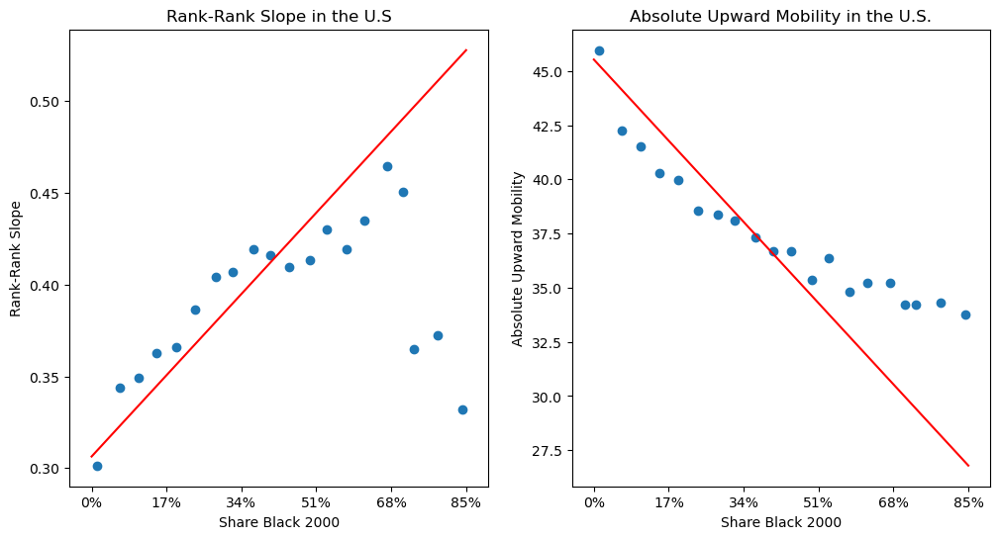

In [66]:
# Load county-level data
counties = county_data.copy()

# Bin the counties based on share_black2000
counties['share_black2000_bin'] = pd.cut(counties['share_black2000'], bins=20)

# Compute mean mobility measures for each bin
mobility_means = counties.groupby('share_black2000_bin').agg({
    'rank_rank': 'mean',
    'absolute_upward': 'mean',
    'share_black2000': 'mean'
}).reset_index()

# Create binned scatterplots
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Rank-rank slope vs share_black2000
ax[0].scatter(mobility_means['share_black2000'], mobility_means['rank_rank'])
ax[0].set_xlabel('Share Black 2000')
ax[0].set_ylabel('Rank-Rank Slope')
ax[0].set_title('Rank-Rank Slope in the U.S')
ax[0].set_xlim(-0.05, 0.9)
ax[0].set_xticks([0, 0.17, 0.34, 0.51, 0.68, 0.85])
ax[0].set_xticklabels(['0%', '17%', '34%', '51%', '68%', '85%'])

# Absolute upward mobility vs share_black2000
ax[1].scatter(mobility_means['share_black2000'], mobility_means['absolute_upward'])
ax[1].set_xlabel('Share Black 2000')
ax[1].set_ylabel('Absolute Upward Mobility')
ax[1].set_title('Absolute Upward Mobility in the U.S.')
ax[1].set_xlim(-0.05, 0.9)
ax[1].set_xticks([0, 0.17, 0.34, 0.51, 0.68, 0.85])
ax[1].set_xticklabels(['0%', '17%', '34%', '51%', '68%', '85%'])


# Add OLS regressions to the scatterplots
for i, col in enumerate(['rank_rank', 'absolute_upward']):
    slope, intercept, rvalue, pvalue, stderr = linregress(counties['share_black2000'], counties[col])
    x_values = np.linspace(0, 0.85, 100)
    y_values = intercept + slope * x_values
    ax[i].plot(x_values, y_values, color='red')

# Show the plots
plt.show()

Percentage Black and mobility in the United States. The figures show binned scatterplots of the County–level relationship between the percentage of the population listed as black in the 2000 census and two alternative mobility measures for children born in the early 1980s. All 2765 counties in the main sample are collapsed into 20 bins based on the share of the population listed as black, and for each bin the mean of each respective mobility measure is depicted. Also shown are fitted OLS regressions based on the underlying (ungrouped) county–level data.

The plot demonstrates the county level connection between the share of the population listed black and the two intergenerational mobility indicators. For the whole of the U.S., Absolute upward mobility decreases as counties where the fraction of the population listed as black is higher.

**County % black higher than 25% in the United States**

To visualise the counties in the U.S. where the black % share is higher than 25%. We filter counties that have a 25% share or higher in the United States and then we use the county Geojson file from the U.S. Cencus Bureu to paint our counties on the U.S. map. As the map below indicates, most of these counties are in the Southeastern U.S. in a region commonly known as the Black Belt which we then draw a line around. To get a line around the area we use coordinates.

In [67]:
# Convert the "COUNTYFP" column to an integer
geojson["COUNTYFP"] = geojson["COUNTYFP"].astype(int)
geojson["STATEFP"] = geojson["STATEFP"].astype(int)

# Inner join county data with GeoJSON file
merged_data = geojson.merge(county_data, how='inner', left_on=['STATEFP', 'COUNTYFP'], right_on=['state', 'county'])

# Filter the data
new_df = merged_data[merged_data.share_black2010 >= 0.25]

# Create choropleth map
fig = px.choropleth(new_df, 
                    geojson=new_df.geometry, 
                    locations=new_df.index, 
                    color='share_black2010',
                    color_continuous_scale="Rainbow",
                    scope="usa",
                    hover_name="NAME",
                    hover_data=['share_black2010'])
fig.update_layout(
    coloraxis_colorbar_title='Share Black'
)
fig.update_layout(
    title={
        'text': "<b>U.S. counties with a Black % share higher than 25%</b>",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    }
)


# Add a trace with a GeoJSON polygon of the boundary of the black belt region
black_belt_boundary = go.Scattergeo(
    locationmode='USA-states',
    lon=[-94.567051, -93.863926, -92.721348, -90.480137, -89.312582, -86.719809, -84.236898, -82.871161, -81.245184, -79.784946, -78.200684,-75.937757, -75.300293, -78.376465, -81.650391, -82.130013, -87.535286, -89.424934, -93.292122, -94.742317, -94.567051],
    lat=[32.367348, 30.945961, 29.941994, 29.483988, 30.674239, 30.712028, 29.858213, 31.635626, 31.335824, 32.606049, 33.987637, 35.801456, 37.899646, 38.124699, 36.436475, 34.636174, 34.563828, 35.749438, 34.888888, 33.103765, 32.367348],
    mode='lines',
    line=dict(width=2, dash='dot', color='black')
)
fig.add_trace(black_belt_boundary)


fig.show()

The above is interactive, by hovering over each county you can see the county name, the index signifies the county FIPS code, and the share black signifies the % share black in each respective county. 

As you can see, the large majority of U.S. counties with a % share black equal to or above 25% are in the southeastern United States, while the counties outside this region is scattered around Midwestern and Northeastern urban areas, such as Detroit, Chicago, New York and more. The Black Belt is a loosely defined area heavily populated by blacks in the southern U.S. Although there is no universal defintion, we decide to define it by finding counties in the south where the population is 25% or higher fraction black.

In [68]:
print("Number of counties colored:", len(new_df))

Number of counties colored: 398


The counties that are colored are 398, but we wonder how many of them are in the Black Belt?

**Investigating the Black Belt**

Lets look at the difference between the number of counties in the Black Belt states and outside these states that have % share black ≥ 25%. We therfore need to find the states which the Black Belt is in. Below is the list of the Black Belt states, where the number for each state is state FIPS code according to the U.S. census bureau:

 1: Alabama  
 5: Arkansas  
 12: Florida  
 13: Georgia  
 22: Louisiana  
 28: Mississippi  
 37: North Carolina  
 45: South Carolina  
 47: Tennessee  
 51: Virginia 


In [69]:
state_list = [1, 5, 12, 13, 22, 28, 37, 45, 47, 48, 51]
print("Black Belt state counties with a % share black ≥ 25%:", len(county_data[(county_data.state.isin(state_list)) & (county_data.share_black2010 >= 0.25)]))

x = len(new_df) - len(county_data[(county_data.state.isin(state_list)) & (county_data.share_black2010 >= 0.25)])
print('Counties outside the Black Belt states with a % share black ≥ 25%: ', x)

Black Belt state counties with a % share black ≥ 25%: 372
Counties outside the Black Belt states with a % share black ≥ 25%:  26


Although the number of counties is much lower, the total population is similar in size.}

Therefore we want to create a new dataframe which only includes the Black Belt counties. Before we do that, we need to change the values of the share_black2000 from % to number for illustrative purposes 

In [70]:
if county_data['share_black2000'].max() <= 1:
    county_data['share_black2000'] = county_data['share_black2000'] * 100

In [71]:
state_df = county_data[county_data.state.isin(state_list)]
black_belt =state_df[state_df.share_black2010>=.25]

**Summary statistics**

We want to know the summary statistics for the county Share black, absolute upward mobility and the rank rank slope for the whole of the U.S., the Black Belt as well as the different regions in the United States. To get the results for different regions in the U.S. we need to create a new column which states which state the county is in. We use the definition from the U.S. Census Bureau to split the U.S. into 4 regions; Northeast, South, Midwest and West. 

First we define a dictionary named region where eack key-value pair in the dictionary represents a region of the U.S and the states that belong to that regionThe keys are the region names (e.g., 'Northeast', 'South', 'Midwest', 'West') and the values are sets of states that belong to each region.

Secondly we define a function named categorize_stat. This function takes a state name as an argument and returns the region to which the state belongs. It does this by iterating over the items in the regions dictionary. For each region, it checks if the state is in the set of states for that region. If it is, it returns the region. If the state is not found in any region, the function returns None.

Finally, a new column called 'region' is added to the DataFrame county_data. The values in this column are generated by applying the categorize_state function to the 'State' column of county_data. This results in a new 'region' column where each row has the region corresponding to the state in that row. 

In [72]:
#Define the regions and the states within each region
regions = {
    "Northeast": {"Connecticut", "Maine", "Massachusetts", "New Hampshire", "Rhode Island", "Vermont", "New Jersey", "New York", "Pennsylvania"},
    "South": {"Delaware", "District of Columbia", "Florida", "Georgia", "Maryland", "North Carolina", "South Carolina", "Virginia", "West Virginia", "Alabama", "Kentucky", "Mississippi", "Tennessee", "Arkansas", "Louisiana", "Oklahoma", "Texas"},
    "Midwest": {"Indiana", "Illinois", "Michigan", "Ohio", "Wisconsin", "Iowa", "Kansas", "Minnesota", "Missouri", "Nebraska", "North Dakota", "South Dakota"},
    "West": {"Arizona", "Colorado", "Idaho", "New Mexico", "Montana", "Utah", "Nevada", "Wyoming", "Alaska", "California", "Hawaii", "Oregon", "Washington"}
}

# Create a function to categorize a state into a region
def categorize_state(State):
    for region, states in regions.items():
        if State in states:
            return region
    return None

# Create a new column in your dataset for the region
county_data.loc[:, 'region'] = county_data['State'].apply(categorize_state)


Now we can get the mean, max, min and standard error of the share black 2000, rank-rank slope and absolute upward mobility for the U.S., Northeast, South, Midwest, West and the Black Belt. To do that we first initialize an empty list to store the results and definee the list of columns for which the statistics will be calculated. Then we calculates statistics for the entire U.S., each region and the Black Belt by iterating through each of the columns of interest in each dataframe. For each column, it calculates the mean, max, min, and standard error (std_err). Then the code appends these statistics, along with the category name ('U.S.','region', 'Black Belt'), to the results list. Once all the statistics have been calculated and added to results, a new DataFrame is created, df_results, from the results list and lastly df_results is printed. 

In [73]:
# List to hold the results
results = []

# List of columns to calculate statistics for
columns = ['share_black2000', 'rank_rank', 'absolute_upward']

# Calculate stats for U.S.
for column in columns:
    mean = round(county_data[column].mean(), 2)
    max_value = round(county_data[column].max(), 2)
    min_value = round(county_data[column].min(), 2)
    std_err = round(sem(county_data[column]), 2)
    results.append(['U.S.', column, mean, max_value, min_value, std_err])

# Calculate stats for each region
regions = ['Northeast', 'South', 'Midwest', 'West']
for region in regions:
    df_region = county_data[county_data['region'] == region]
    for column in columns:
        mean = round(df_region[column].mean(), 2)
        max_value = round(df_region[column].max(), 2)
        min_value = round(df_region[column].min(), 2)
        std_err = round(sem(df_region[column]), 2)
        results.append([region, column, mean, max_value, min_value, std_err])

# Calculate stats for the Black Belt
for column in columns:
    mean = round(black_belt[column].mean(), 2)
    max_value = round(black_belt[column].max(), 2)
    min_value = round(black_belt[column].min(), 2)
    std_err = round(sem(black_belt[column]), 2)
    results.append(['Black Belt', column, mean, max_value, min_value, std_err])

# Create a DataFrame from the results
df_results = pd.DataFrame(results, columns=['', 'Variable', 'Mean', 'Max', 'Min', 'StdErr'])

# Print the DataFrame
print(df_results)


                       Variable   Mean    Max    Min  StdErr
0         U.S.  share_black2000   9.42  85.86   0.01    0.28
1         U.S.        rank_rank   0.33   0.66   0.07    0.00
2         U.S.  absolute_upward  43.45  63.78  24.31    0.10
3    Northeast  share_black2000   4.66  41.68   0.18    0.45
4    Northeast        rank_rank   0.32   0.41   0.20    0.00
5    Northeast  absolute_upward  44.62  52.43  37.14    0.19
6        South  share_black2000  17.23  85.86   0.01    0.49
7        South        rank_rank   0.36   0.55   0.07    0.00
8        South  absolute_upward  40.67  60.09  30.86    0.12
9      Midwest  share_black2000   2.38  50.21   0.03    0.15
10     Midwest        rank_rank   0.32   0.66   0.09    0.00
11     Midwest  absolute_upward  46.63  63.78  24.31    0.19
12        West  share_black2000   1.43  15.60   0.04    0.12
13        West        rank_rank   0.26   0.44   0.10    0.00
14        West  absolute_upward  44.93  61.70  30.68    0.24
15  Black Belt  share_bl

The table above provides summary statistics for the most important variables at the county level for the whole of the U.S., regions and the Black Belt. The U.S. county with the highest African American share is in the Black-Belt. The highest mean for the rank-rank slope (lowest relative mobility) as well as the lowest mean for absolute upward mobility (lowest absolute mobility) is in the Black Belt. 

**The effect of the % share black on intergenerational mobility**

Now we will investigate further the effect of the % share black on the intergenerational mobility metrics by region. We do this by running a regression where the intergenerational mobility metric is the dependant variable while the share black is the independant variable. To do this we run an ordinary least squared regression and in the regression we includ state fixed effects to mitigate the effect of different state on the relationship between intergenerational mobility and the % share black.  

Firstly, we create two lists, the categories are the whole of the U.S., the regions and the Black Belt, and columns are the intergenerational mobility metrics we are interested in. We create a dictionary called dfs that store the relavent dataframe for each category.

In [74]:
# List of categories to calculate statistics for
categories = ['U.S.'] + ['Northeast', 'South', 'Midwest', 'West'] + ['Black Belt']

# List of columns to calculate statistics for
columns = ['rank_rank', 'absolute_upward']

# DataFrames for each category
dfs = {
    'U.S.': county_data,
    'Northeast': county_data[county_data['region'] == 'Northeast'],
    'South': county_data[county_data['region'] == 'South'],
    'Midwest': county_data[county_data['region'] == 'Midwest'],
    'West': county_data[county_data['region'] == 'West'],
    'Black Belt': black_belt
}

Then we can use the run_regression function in dataproject py file to see the effect of % share black on intergenerational mobility. We use the dataframes for each region, the two lists which are categories and columns and finally the independant variable share_black2000.

In [75]:
# import your function from your Python file
from dataproject import run_regression

# Run regression for first set of variables
run_regression(dfs, categories, columns, ['share_black2000'])

      Category         Variable Coefficient
0         U.S.        rank_rank     0.0018*
1         U.S.  absolute_upward    -0.1494*
2    Northeast        rank_rank     0.0016*
3    Northeast  absolute_upward    -0.2317*
4        South        rank_rank     0.0016*
5        South  absolute_upward    -0.1274*
6      Midwest        rank_rank     0.0044*
7      Midwest  absolute_upward    -0.4289*
8         West        rank_rank      0.0014
9         West  absolute_upward    -0.1958*
10  Black Belt        rank_rank     0.0006*
11  Black Belt  absolute_upward    -0.0983*


The share_black2000 coefficient is statistically significant at the 5% for both variables in all categories except for the rank-rank slope in the West. To interpret these results lets use an example: a child living in a county in the South with a county share black of 20% will have a $-0.1274*20 = -2.548%$ less income relative to a child born in a Southern county with a county share black of 0%. 

Now lets see how the link between intergenerational mobility and share black changes when we include the variable for the share of children with a single parent. 

In [76]:
# Run regression for second set of variables
run_regression(dfs, categories, columns, ['share_black2000', 'singleparent_share2000'])

      Category         Variable Coefficient
0         U.S.        rank_rank     0.0003*
1         U.S.  absolute_upward      0.0134
2    Northeast        rank_rank      0.0004
3    Northeast  absolute_upward    -0.0931*
4        South        rank_rank     0.0009*
5        South  absolute_upward    -0.0370*
6      Midwest        rank_rank     0.0013*
7      Midwest  absolute_upward    -0.0838*
8         West        rank_rank      0.0008
9         West  absolute_upward     -0.1479
10  Black Belt        rank_rank      0.0001
11  Black Belt  absolute_upward     -0.0072


Now we can see that the share black coefficient becomes statistically insignificant in most regions for both the rank-rank slope and absolute upward mobility and the explanatory power of the share black also decreases signficantly. 

## Explore each data set

In order to be able to **explore the raw data**, you may provide **static** and **interactive plots** to show important developments 

**Interactive plot** :

In [77]:
def plot_func():
    # Function that operates on data set
    pass

widgets.interact(plot_func, 
    # Let the widget interact with data through plot_func()    
); 


interactive(children=(Output(),), _dom_classes=('widget-interact',))

Explain what you see when moving elements of the interactive plot around. 

# Merge data sets

Now you create combinations of your loaded data sets. Remember the illustration of a (inner) **merge**:

Here we are dropping elements from both data set X and data set Y. A left join would keep all observations in data X intact and subset only from Y. 

Make sure that your resulting data sets have the correct number of rows and columns. That is, be clear about which observations are thrown away. 

**Note:** Don't make Venn diagrams in your own data project. It is just for exposition. 

# Analysis

To get a quick overview of the data, we show some **summary statistics** on a meaningful aggregation. 

MAKE FURTHER ANALYSIS. EXPLAIN THE CODE BRIEFLY AND SUMMARIZE THE RESULTS.

# Conclusion

ADD CONCISE CONLUSION.